# Load Packages

In [109]:
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
# using Turing
# using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using OrdinaryDiffEq
using LsqFit
using BlackBoxOptim
using LaTeXStrings
using Trapz
using HypothesisTests


# Extract and visualise data

In [2]:
Dat1_2M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\2Million_Rep1_HepG2_16_01_2024.csv", DataFrame));
Dat2_2M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\2Million_Rep2_HepG2_05_02_2024.csv", DataFrame));
Dat3_2M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\2Million_Rep3_HepG2_08_03_2024.csv", DataFrame));

Dat1_4M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Rep1_HepG2_16_01_2024.csv", DataFrame));
Dat2_4M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Rep2_HepG2_29_01_2024.csv", DataFrame));
Dat3_4M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Rep3_HepG2_24_05_2024.csv", DataFrame));

Dat1_8M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\8Million_Rep1_HepG2_16_01_2024.csv", DataFrame));
Dat2_8M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\8Million_Rep2_HepG2_01_03_2024.csv", DataFrame));
Dat3_8M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\8Million_Rep3_HepG2_04_03_2024.csv", DataFrame));

Dat1_8M_NoCO2 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\8Million_NoCO2_Rep1_Try3_HepG2_07_03_2024.csv", DataFrame));
Dat2_8M_NoCO2 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\8Million_NoCO2_Rep2_Try1_HepG2_13_08_2024.csv", DataFrame));
Dat3_8M_NoCO2 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\8Million_NoCO2_Rep3_Try2_HepG2_13_08_2024.csv", DataFrame));

Dat1_4M_Lysed = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_LysateNADH184uM_Rep1_HepG2_28_05_2024.csv", DataFrame));
Dat2_4M_Lysed = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_LysateNADH184uM_Rep2_HepG2_07_06_2024_Try1.csv", DataFrame));
Dat3_4M_Lysed = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_LysateNADH184uM_Rep3_HepG2_07_06_2024_Try2.csv", DataFrame));

Dat1_4M_64mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Pyruvate6.4mM_Rep1_HepG2_19_06_2024.csv", DataFrame));
# Dat2_4M_64mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_LysateNADH184uM_Rep2_HepG2_07_06_2024_Try1.csv", DataFrame));
# Dat3_4M_64mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_LysateNADH184uM_Rep3_HepG2_07_06_2024_Try2.csv", DataFrame));

Dat1_4M_128mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Pyruvate12.8mM_Rep1_HepG2_18_06_2024.csv", DataFrame));
Dat2_4M_128mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Pyruvate12.8mM_Rep2_Try1_HepG2_08_08_2024.csv", DataFrame));
Dat3_4M_128mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Pyruvate12.8mM_Rep3_Try2_HepG2_08_08_2024.csv", DataFrame));

Dat1_4M_128mMLysed = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_Pyruvate12.8mM_LysedCells_Rep1_HepG2_20_06_2024.csv", DataFrame));
# Dat2_4M_128mMLysed = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_LysateNADH184uM_Rep2_HepG2_07_06_2024_Try1.csv", DataFrame));
# Dat3_4M_128mMLysed = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\4Million_LysateNADH184uM_Rep3_HepG2_07_06_2024_Try2.csv", DataFrame));

# Dat1_4M_Rich = 
# Dat2_4M_Rich = 
# Dat3_4M_Rich = 



Dat1_0M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\0Million_Rep1_HepG2_05_05_2025.csv", DataFrame));
Dat2_0M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\0Million_Rep1_HepG2_18_04_2025.csv", DataFrame));
Dat3_0M = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\RawData\\0Million_Rep1_HepG2_18_04_2025_TryControl3.csv", DataFrame));

In [3]:
m01 = trapz(vcat(Dat1_0M[1,1], Dat1_0M[5:end, 1]), vcat(Dat1_0M[1,3], Dat1_0M[5:end, 3]))
m02 = trapz(vcat(Dat2_0M[1,1], Dat2_0M[5:end, 1]), vcat(Dat2_0M[1,3], Dat2_0M[5:end, 3]))
m03 = trapz(vcat(Dat3_0M[1,1], Dat3_0M[5:end, 1]), vcat(Dat3_0M[1,3], Dat3_0M[5:end, 3]))

m21 = trapz(vcat(Dat1_2M[1,1], Dat1_2M[5:end, 1]), vcat(Dat1_2M[1,3], Dat1_2M[5:end, 3]))
m22 = trapz(vcat(Dat2_2M[1,1], Dat2_2M[5:end, 1]), vcat(Dat2_2M[1,3], Dat2_2M[5:end, 3]))
m23 = trapz(vcat(Dat3_2M[1,1], Dat3_2M[5:end, 1]), vcat(Dat3_2M[1,3], Dat3_2M[5:end, 3]))

m41 = trapz(vcat(Dat1_4M[1,1], Dat1_4M[5:end, 1]), vcat(Dat1_4M[1,3], Dat1_4M[5:end, 3]))
m42 = trapz(vcat(Dat2_4M[1,1], Dat2_4M[5:end, 1]), vcat(Dat2_4M[1,3], Dat2_4M[5:end, 3]))
m43 = trapz(vcat(Dat3_4M[1,1], Dat3_4M[5:end, 1]), vcat(Dat3_4M[1,3], Dat3_4M[5:end, 3]))

m81 = trapz(vcat(Dat1_8M[1,1], Dat1_8M[5:end, 1]), vcat(Dat1_8M[1,3], Dat1_8M[5:end, 3]))
m82 = trapz(vcat(Dat2_8M[1,1], Dat2_8M[5:end, 1]), vcat(Dat2_8M[1,3], Dat2_8M[5:end, 3]))
m83 = trapz(vcat(Dat3_8M[1,1], Dat3_8M[5:end, 1]), vcat(Dat3_8M[1,3], Dat3_8M[5:end, 3]))

aucs = mean([m01, m02, m03]), mean([m21, m22, m23]), mean([m41, m42, m43]), mean([m81, m82, m83])

(35.09559116666667, 5931.102332333335, 13395.693859333338, 26182.370154500008)

In [23]:
aucs[2]/aucs[1]

168.99850195333417

In [24]:
aucs[3]/aucs[2]

2.2585504529751357

In [25]:
aucs[4]/aucs[3]

1.9545363181211894

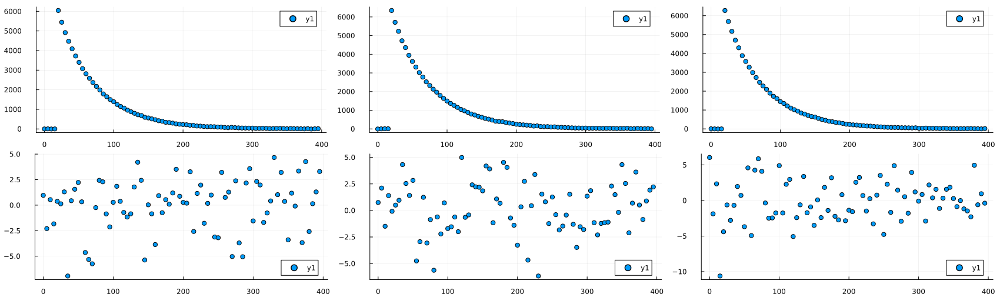

In [4]:
p1=plot(scatter(Dat1_0M[:,1], Dat1_0M[:,2]), scatter(Dat2_0M[:,1], Dat2_0M[:,2]), scatter(Dat3_0M[:,1], Dat3_0M[:,2]), layout=(1,3), size=(1700,500))
p2=plot(scatter(Dat1_0M[:,1], Dat1_0M[:,3]), scatter(Dat2_0M[:,1], Dat2_0M[:,3]), scatter(Dat3_0M[:,1], Dat3_0M[:,3]), layout=(1,3), size=(1700,500))

plot(p1,p2, layout = (2,1)) # Delay is 3 time points

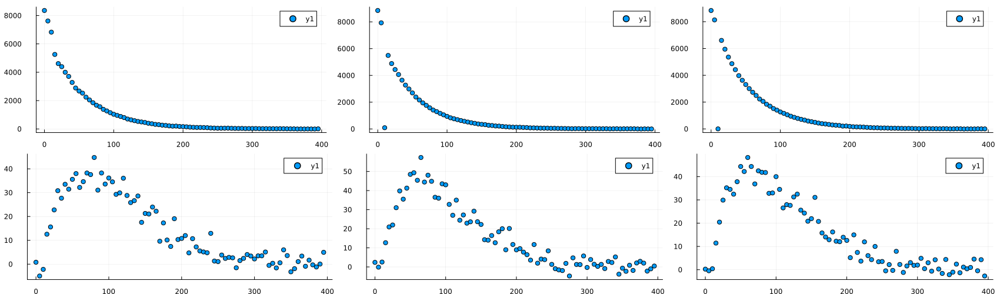

In [3]:
p1=plot(scatter(Dat1_2M[:,1], Dat1_2M[:,2]), scatter(Dat2_2M[:,1], Dat2_2M[:,2]), scatter(Dat3_2M[:,1], Dat3_2M[:,2]), layout=(1,3), size=(1700,500))
p2=plot(scatter(Dat1_2M[:,1], Dat1_2M[:,3]), scatter(Dat2_2M[:,1], Dat2_2M[:,3]), scatter(Dat3_2M[:,1], Dat3_2M[:,3]), layout=(1,3), size=(1700,500))

plot(p1,p2, layout = (2,1)) # Delay is 3 time points

In [4]:
d2m = 3

3

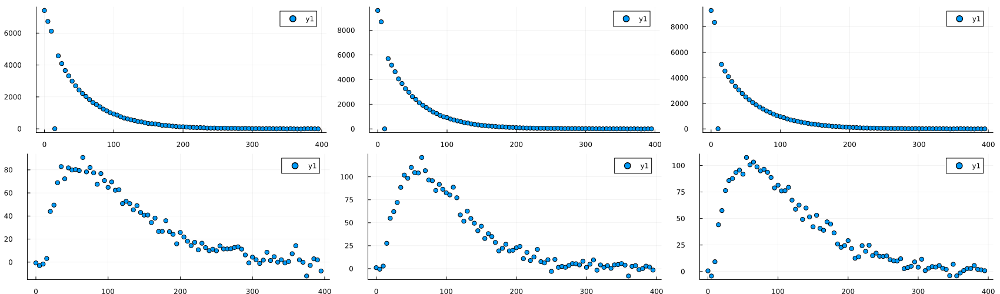

In [4]:
# p1=plot(scatter(Dat1_4M[:,1], Dat1_4M[:,2]), scatter(Dat2_4M[:,1], Dat2_4M[:,2]), layout=(1,3), size=(1700,500))
# p2=plot(scatter(Dat1_4M[:,1], Dat1_4M[:,3]), scatter(Dat2_4M[:,1], Dat2_4M[:,3]), layout=(1,3), size=(1700,500))

p1=plot(scatter(Dat1_4M[:,1], Dat1_4M[:,2]), scatter(Dat2_4M[:,1], Dat2_4M[:,2]), scatter(Dat3_4M[:,1], Dat3_4M[:,2]), layout=(1,3), size=(1700,500))
p2=plot(scatter(Dat1_4M[:,1], Dat1_4M[:,3]), scatter(Dat2_4M[:,1], Dat2_4M[:,3]), scatter(Dat3_4M[:,1], Dat3_4M[:,3]), layout=(1,3), size=(1700,500))

plot(p1,p2, layout = (2,1)) # Delay is 3 time points, except for the first....

In [6]:
d4m = 3 # Carefull with the first replicate!!!

3

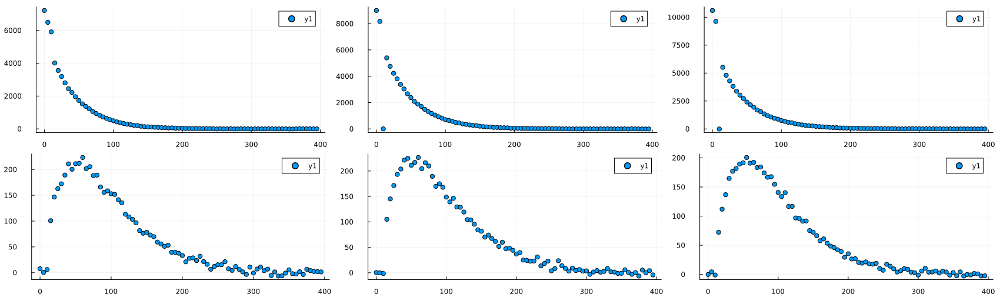

In [5]:
p1=plot(scatter(Dat1_8M[:,1], Dat1_8M[:,2]), scatter(Dat2_8M[:,1], Dat2_8M[:,2]), scatter(Dat3_8M[:,1], Dat3_8M[:,2]), layout=(1,3), size=(1700,500))
p2=plot(scatter(Dat1_8M[:,1], Dat1_8M[:,3]), scatter(Dat2_8M[:,1], Dat2_8M[:,3]), scatter(Dat3_8M[:,1], Dat3_8M[:,3]), layout=(1,3), size=(1700,500))

plot(p1,p2, layout = (2,1)) # Delay is 3 time points

In [9]:
d8m = 3

3

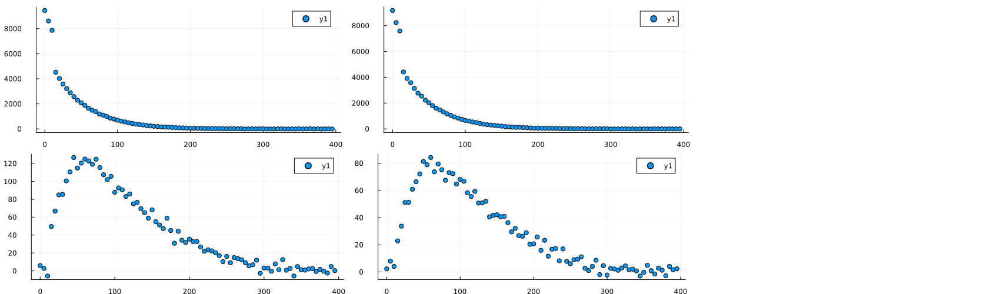

In [6]:
p1=plot(scatter(Dat1_8M_NoCO2[:,1], Dat1_8M_NoCO2[:,2]), scatter(Dat2_8M_NoCO2[:,1], Dat2_8M_NoCO2[:,2]), layout=(1,3), size=(1700,500))
p2=plot(scatter(Dat1_8M_NoCO2[:,1], Dat1_8M_NoCO2[:,3]), scatter(Dat2_8M_NoCO2[:,1], Dat2_8M_NoCO2[:,3]), layout=(1,3), size=(1700,500))

# p1=plot(scatter(Dat1_8M_NoCO2[:,1], Dat1_8M_NoCO2[:,2]), scatter(Dat2_8M_NoCO2[:,1], Dat2_8M_NoCO2[:,2]), scatter(Dat3_8M_NoCO2[:,1], Dat3_8M_NoCO2[:,2]), layout=(1,3), size=(1700,500))
# p2=plot(scatter(Dat1_8M_NoCO2[:,1], Dat1_8M_NoCO2[:,3]), scatter(Dat2_8M_NoCO2[:,1], Dat2_8M_NoCO2[:,3]), scatter(Dat3_8M_NoCO2[:,1], Dat3_8M_NoCO2[:,3]), layout=(1,3), size=(1700,500))

plot(p1,p2, layout = (2,1)) # Delay is 3 time points

In [46]:
d8mnc = 3

3

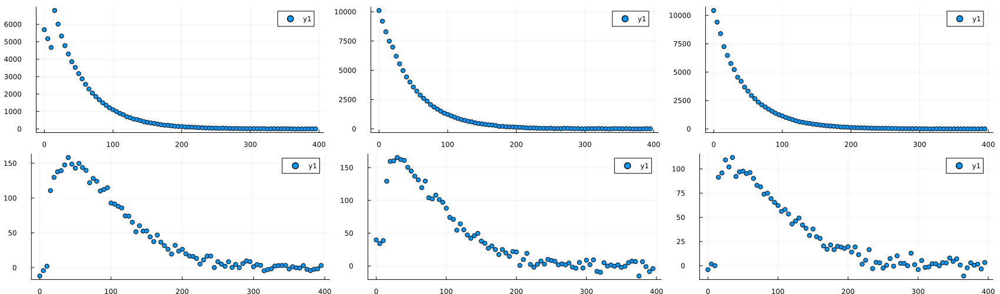

In [7]:
p1=plot(scatter(Dat1_4M_Lysed[:,1], Dat1_4M_Lysed[:,2]), scatter(Dat2_4M_Lysed[:,1], Dat2_4M_Lysed[:,2]), scatter(Dat3_4M_Lysed[:,1], Dat3_4M_Lysed[:,2]), layout=(1,3), size=(1700,500))
p2=plot(scatter(Dat1_4M_Lysed[:,1], Dat1_4M_Lysed[:,3]), scatter(Dat2_4M_Lysed[:,1], Dat2_4M_Lysed[:,3]), scatter(Dat3_4M_Lysed[:,1], Dat3_4M_Lysed[:,3]), layout=(1,3), size=(1700,500))

plot(p1,p2, layout = (2,1)) # Delay is 3 time points

# Create Structure with all data

In [ ]:
Dat = Array{Any}(undef, 25);
Dat[1] = Dat1_2M;
Dat[2] = Dat2_2M;
Dat[3] = Dat3_2M;
Dat[4] = Dat1_4M;
Dat[5] = Dat2_4M;
Dat[6] = Dat3_4M;
Dat[7] = Dat1_8M;
Dat[8] = Dat2_8M;
Dat[9] = Dat3_8M;
Dat[10] = Dat1_8M_NoCO2;
Dat[11] = Dat2_8M_NoCO2;
Dat[12] = Dat3_8M_NoCO2;
Dat[13] = Dat1_4M_Lysed;
Dat[14] = Dat2_4M_Lysed;
Dat[15] = Dat3_4M_Lysed;
# Dat[16] = Dat1_4M_64mM;
# # Dat[17] = Dat2_4M_64mM;
# # Dat[18] = Dat3_4M_64mM;
# Dat[19] = Dat1_4M_128mM;
# Dat[20] = Dat2_4M_128mM;
# Dat[21] = Dat3_4M_128mM;
# Dat[22] = Dat1_4M_128mMLysed;
# Dat[23] = Dat2_4M_128mMLysed;
# Dat[24] = Dat3_4M_128mMLysed;



# Dat[16] = Dat1_4M_Rich;
# Dat[17] = Dat2_4M_Rich;
# Dat[18] = Dat3_4M_Rich;

Dat[23] = Dat1_0M;
Dat[24] = Dat2_0M;
Dat[25] = Dat3_0M;

# Fit T1, extract P0

In [8]:
T1s = zeros(15);
P0s = zeros(15);

m(t,p) =  p[1].*exp.(-t.*p[2]);
p0 = [10000, 0.01];

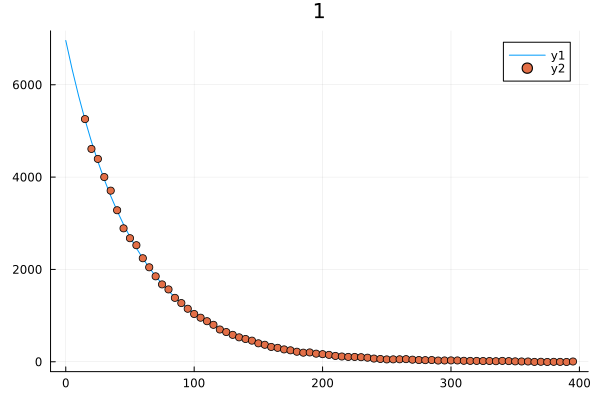

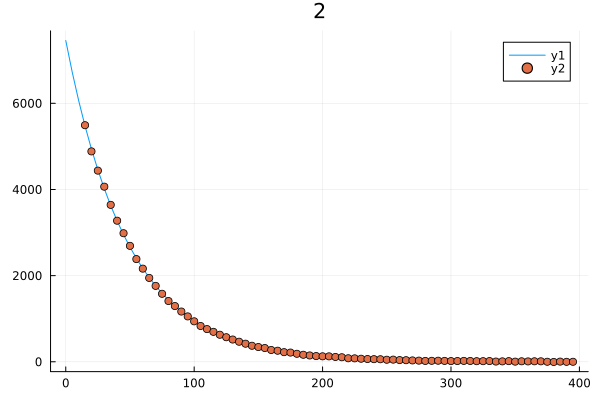

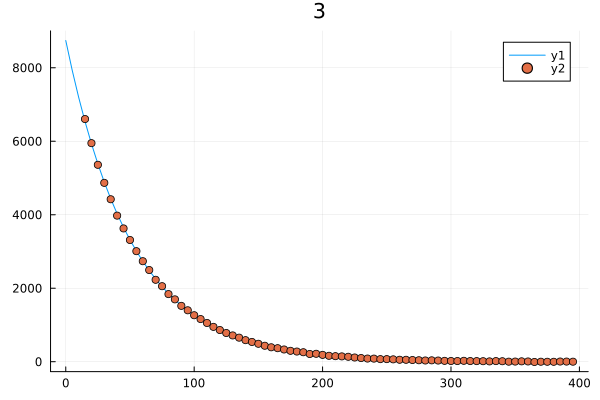

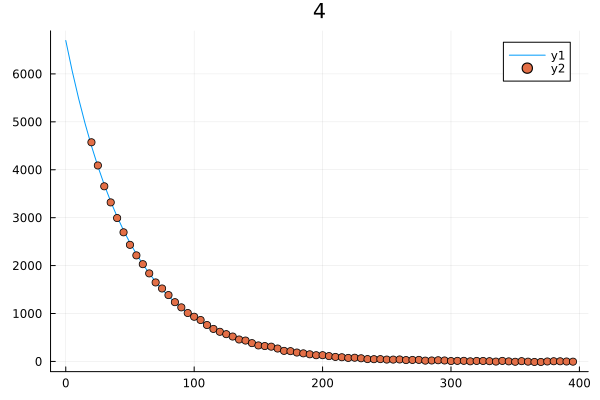

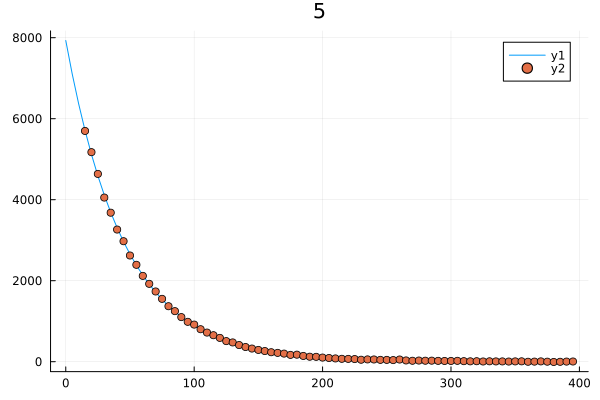

...

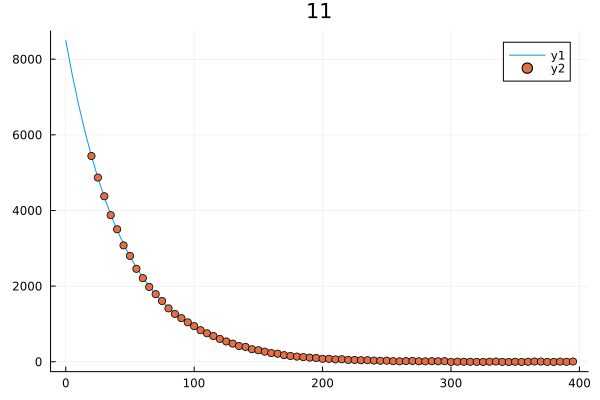

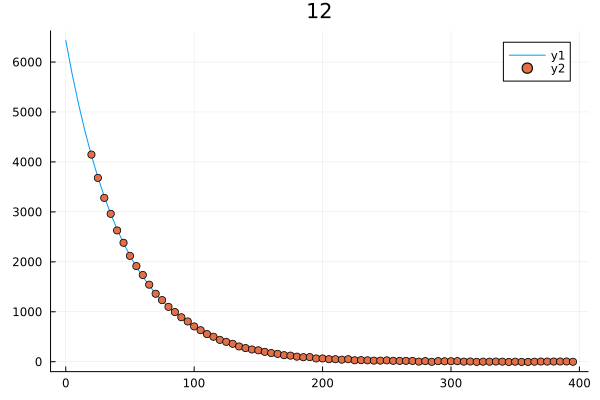

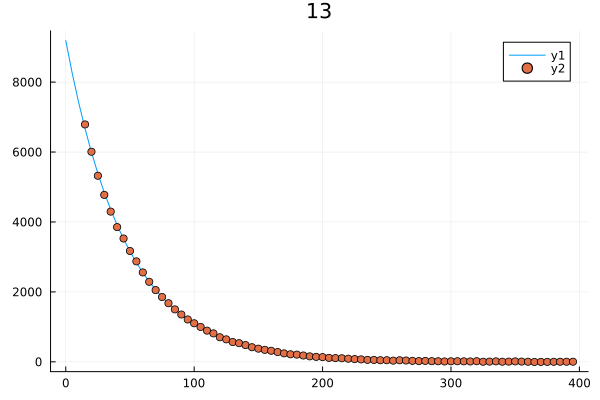

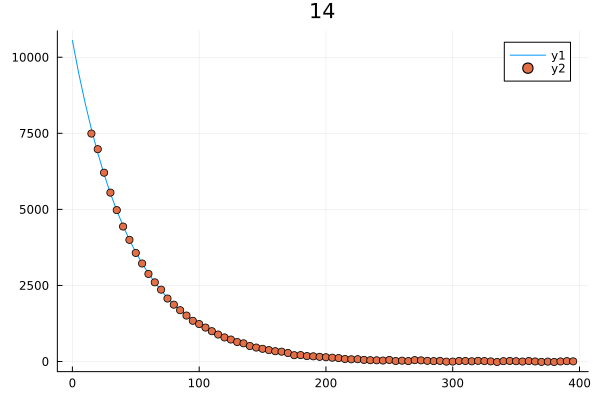

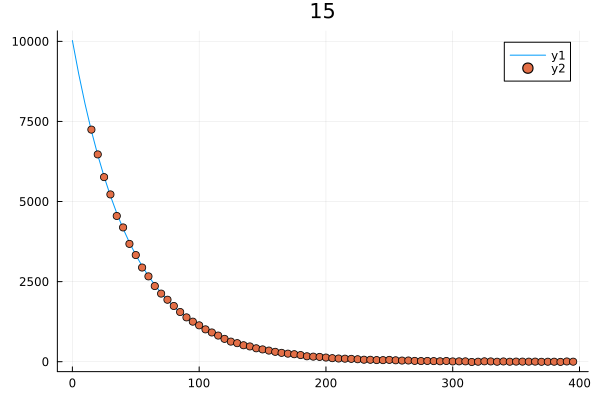

In [9]:
i=1
for i in 1:15
    if isassigned(Dat,i)

        if i == 4 || i ==11 || i == 12
            t = Dat[i][5:end,1];
            d = Dat[i][5:end,2];
        else
            t = Dat[i][4:end,1];
            d = Dat[i][4:end,2];
        end
        
        fit = curve_fit(m, t, d, p0);

        pp=plot(Dat[i][:,1], m(Dat[i][:,1], coef(fit)), title=string(i))
        scatter!(t, d)

        T1s[i] = 1/coef(fit)[2];
        P0s[i] = m(Dat[i][1,1], coef(fit));

        display(pp)

    end
end

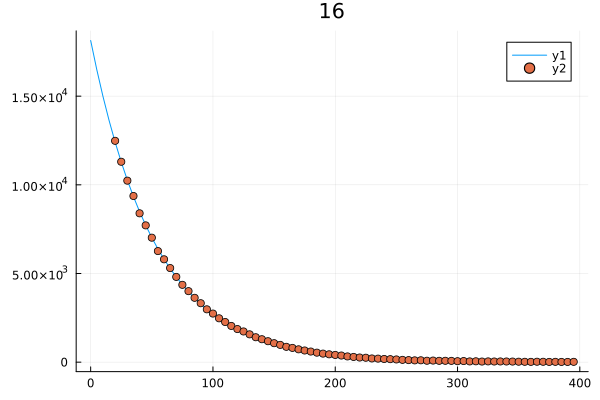

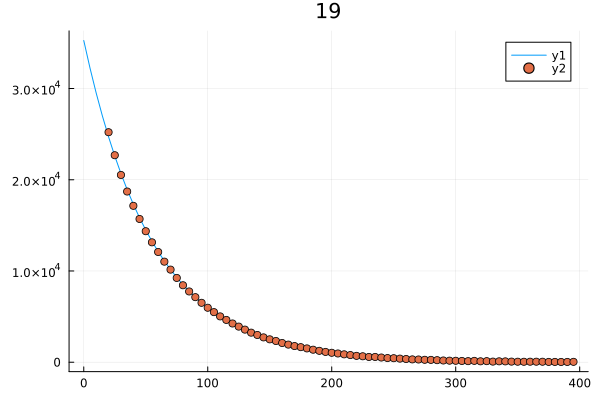

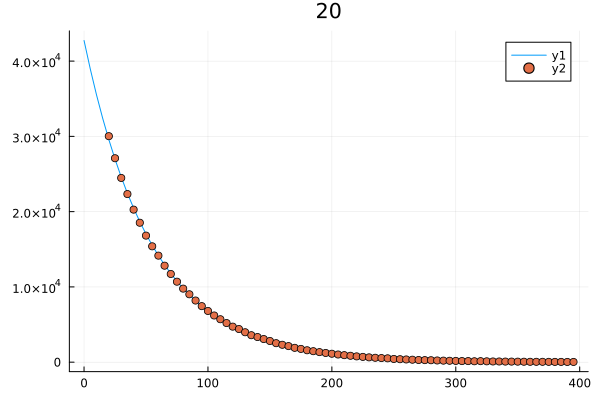

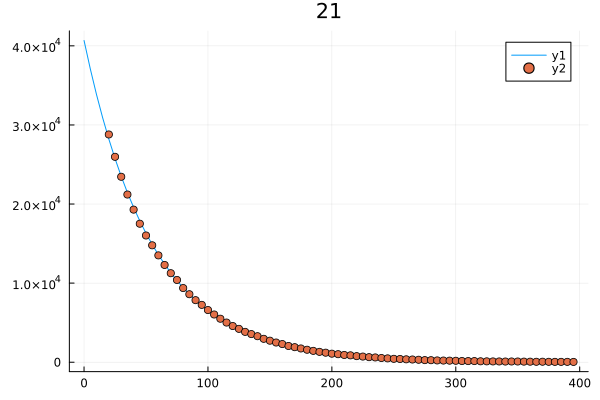

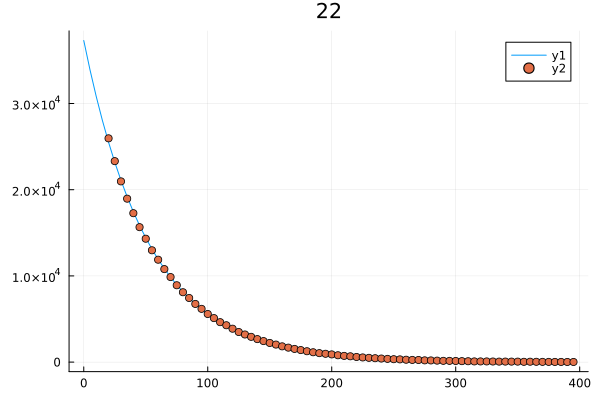

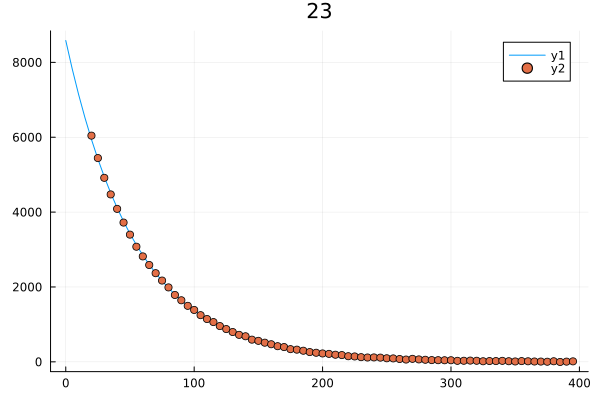

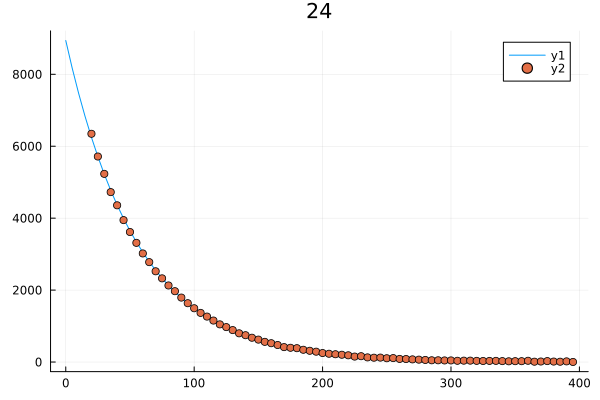

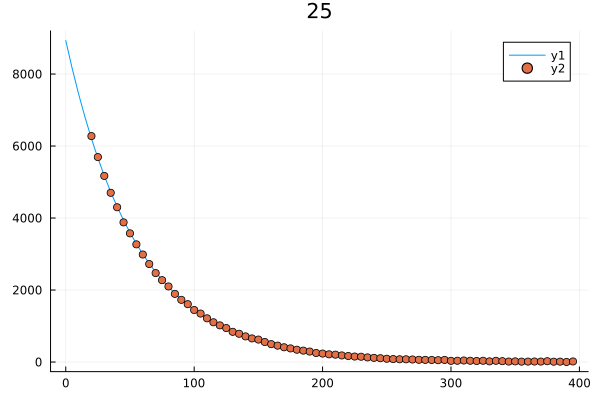

In [10]:
T1s2 = zeros(25);
P0s2 = zeros(25);

m(t,p) =  p[1].*exp.(-t.*p[2]);
p0 = [10000, 0.01];
i=1
for i in 16:25
    if isassigned(Dat,i)

        t = Dat[i][5:end,1];
        d = Dat[i][5:end,2];

        fit = curve_fit(m, t, d, p0);

        pp=plot(Dat[i][:,1], m(Dat[i][:,1], coef(fit)), title=string(i))
        scatter!(t, d)

        T1s2[i] = 1/coef(fit)[2];
        P0s2[i] = m(Dat[i][1,1], coef(fit));

        display(pp)

    end
end

# Save Extracted T1

#### Compute Real T1s

In [11]:
delta = 5; # Time between pulses
omma = 15; # flip angle

tx = abs(delta/log(cos(deg2rad(omma))));

RT1s = 1 ./((1 ./T1s) .- (1 ./tx));

In [17]:
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\T1s.csv",
    DataFrame(Tables.table([["2M_1","2M_2","2M_3","4M_1","4M_2","4M_3","8M_1","8M_2","8M_3","8M_1_NC2","8M_2_NC2","8M_3_NC2","4M_1_RM","4M_2_RM","4M_3_RM"] T1s RT1s])),
    header=["Exper", "Measured_T1", "Real_T1"])

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\T1s.csv"

In [10]:
using JLD2

In [11]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\P0s.jld", "P0s", P0s)

# Save Data with computed P0

#### 0 Million

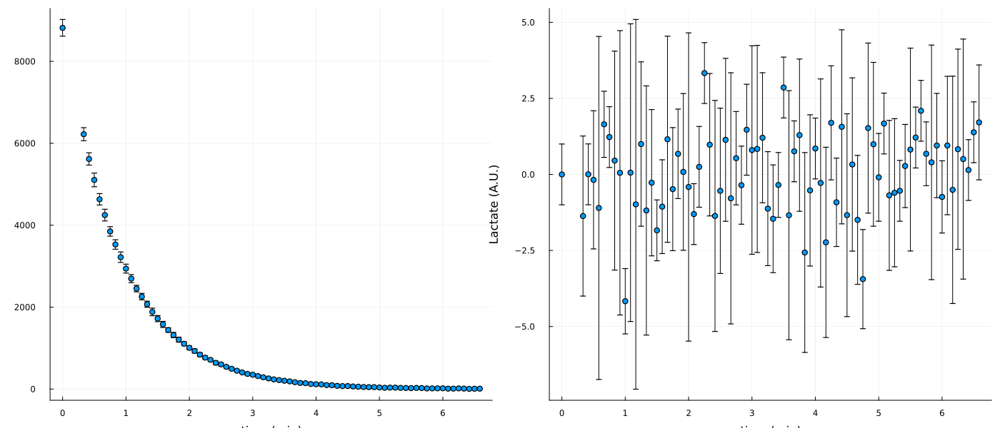

In [13]:
tim = vcat(Dat[1][1,1], Dat[1][5:end,1]);
pyrMEAN = mean([vcat(P0s2[23], Dat[23][5:end,2]) vcat(P0s2[24], Dat[24][5:end,2]) vcat(P0s2[25], Dat[25][5:end,2])], dims = 2);
pyrSTD = std([vcat(P0s2[23], Dat[23][5:end,2]) vcat(P0s2[24], Dat[24][5:end,2]) vcat(P0s2[25], Dat[25][5:end,2])], dims = 2);
lacMEAN = mean([vcat(0, Dat[23][5:end,3]) vcat(0, Dat[24][5:end,3]) vcat(0, Dat[25][5:end,3])], dims = 2);
lacSTD = std([vcat(0, Dat[23][5:end,3]) vcat(0, Dat[24][5:end,3]) vcat(0, Dat[25][5:end,3])], dims = 2);

for i in 1:length(pyrSTD)
    if pyrSTD[i] < 1
        pyrSTD[i] = 1;
    end
    if lacSTD[i] < 1
        lacSTD[i] = 1;
    end
end

CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\0Mil_Dat.csv",
    DataFrame([tim pyrMEAN pyrSTD lacMEAN lacSTD], :auto), 
    header=["time", "Pyr_MEAN", "Pyr_STD", "Lac_MEAN", "Lac_STD"]);


plot(scatter(tim./60, pyrMEAN, yerror = pyrSTD, label = "", ylabel = "Pyruvate (A.U.)", xlabel = "time (min)"), 
    scatter(tim./60, lacMEAN, yerror = lacSTD, label = "", ylabel = "Lactate (A.U.)", xlabel = "time (min)"), size = (1400, 600))

#### 2 Million

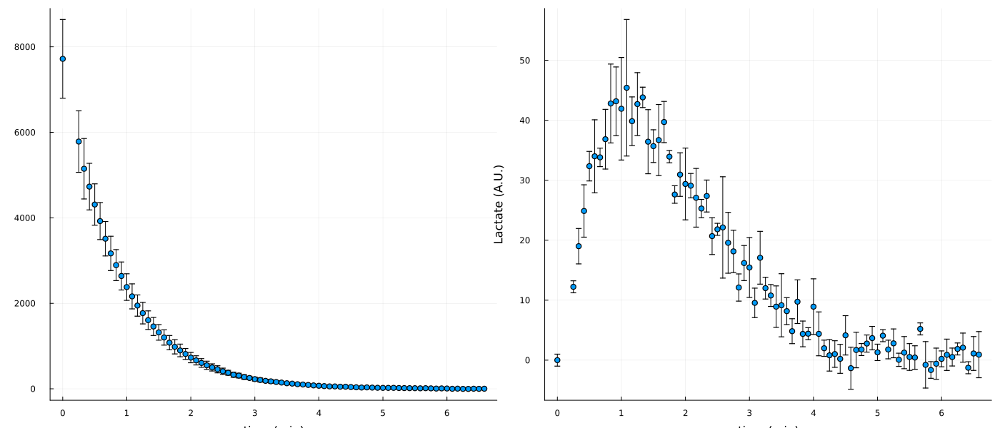

In [9]:
tim = vcat(Dat[1][1,1], Dat[1][4:end,1]);
pyrMEAN = mean([vcat(P0s[1], Dat[1][4:end,2]) vcat(P0s[2], Dat[2][4:end,2]) vcat(P0s[3], Dat[3][4:end,2])], dims = 2);
pyrSTD = std([vcat(P0s[1], Dat[1][4:end,2]) vcat(P0s[2], Dat[2][4:end,2]) vcat(P0s[3], Dat[3][4:end,2])], dims = 2);
lacMEAN = mean([vcat(0, Dat[1][4:end,3]) vcat(0, Dat[2][4:end,3]) vcat(0, Dat[3][4:end,3])], dims = 2);
lacSTD = std([vcat(0, Dat[1][4:end,3]) vcat(0, Dat[2][4:end,3]) vcat(0, Dat[3][4:end,3])], dims = 2);

for i in 1:length(pyrSTD)
    if pyrSTD[i] < 1
        pyrSTD[i] = 1;
    end
    if lacSTD[i] < 1
        lacSTD[i] = 1;
    end
end

# CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\2Mil_Dat.csv",
#     DataFrame([tim pyrMEAN pyrSTD lacMEAN lacSTD], :auto), 
#     header=["time", "Pyr_MEAN", "Pyr_STD", "Lac_MEAN", "Lac_STD"]);


plot(scatter(tim./60, pyrMEAN, yerror = pyrSTD, label = "", ylabel = "Pyruvate (A.U.)", xlabel = "time (min)"), 
    scatter(tim./60, lacMEAN, yerror = lacSTD, label = "", ylabel = "Lactate (A.U.)", xlabel = "time (min)"), size = (1400, 600))

#### 4 Million

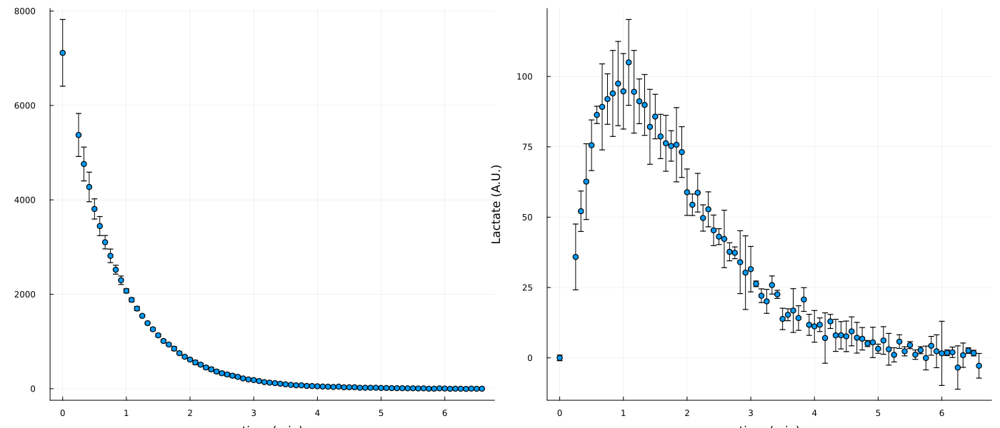

In [19]:
tim = vcat(Dat[1][1,1], Dat[1][4:end,1]);
pyrMEAN = mean([vcat(P0s[4], Dat[4][4:end,2]) vcat(P0s[5], Dat[5][4:end,2]) vcat(P0s[6], Dat[6][4:end,2])], dims = 2);
pyrSTD = std([vcat(P0s[4], Dat[4][4:end,2]) vcat(P0s[5], Dat[5][4:end,2]) vcat(P0s[6], Dat[6][4:end,2])], dims = 2);
lacMEAN = mean([vcat(0, Dat[4][4:end,3]) vcat(0, Dat[5][4:end,3]) vcat(0, Dat[6][4:end,3])], dims = 2);
lacSTD = std([vcat(0, Dat[4][4:end,3]) vcat(0, Dat[5][4:end,3]) vcat(0, Dat[6][4:end,3])], dims = 2);
pyrMEAN[2] = mean([Dat[5][4,2] Dat[6][4,2]]);
pyrSTD[2] = std([Dat[5][4,2] Dat[6][4,2]]);
lacMEAN[2] = mean([Dat[5][4,3] Dat[6][4,3]]);
lacSTD[2] = std([Dat[5][4,3] Dat[6][4,3]]);


# pyrMEAN = mean([vcat(P0s[4], Dat[4][4:end,2]) vcat(P0s[5], Dat[5][4:end,2]) ], dims = 2);
# pyrSTD = std([vcat(P0s[4], Dat[4][4:end,2]) vcat(P0s[5], Dat[5][4:end,2]) ], dims = 2);
# lacMEAN = mean([vcat(0, Dat[4][4:end,3]) vcat(0, Dat[5][4:end,3]) ], dims = 2);
# lacSTD = std([vcat(0, Dat[4][4:end,3]) vcat(0, Dat[5][4:end,3]) ], dims = 2);
# pyrMEAN[2] = mean([Dat[5][4,2]]);
# pyrSTD[2] = std([Dat[5][4,2]]);
# lacMEAN[2] = mean([Dat[5][4,3]]);
# lacSTD[2] = std([Dat[5][4,3]]);


for i in 1:length(pyrSTD)
    if pyrSTD[i] < 1
        pyrSTD[i] = 1;
    end
    if lacSTD[i] < 1
        lacSTD[i] = 1;
    end
end

CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv",
    DataFrame([tim pyrMEAN pyrSTD lacMEAN lacSTD], :auto), 
    header=["time", "Pyr_MEAN", "Pyr_STD", "Lac_MEAN", "Lac_STD"]);


plot(scatter(tim./60, pyrMEAN, yerror = pyrSTD, label = "", ylabel = "Pyruvate (A.U.)", xlabel = "time (min)"), 
    scatter(tim./60, lacMEAN, yerror = lacSTD, label = "", ylabel = "Lactate (A.U.)", xlabel = "time (min)"), size = (1400, 600))

#### 8 Million

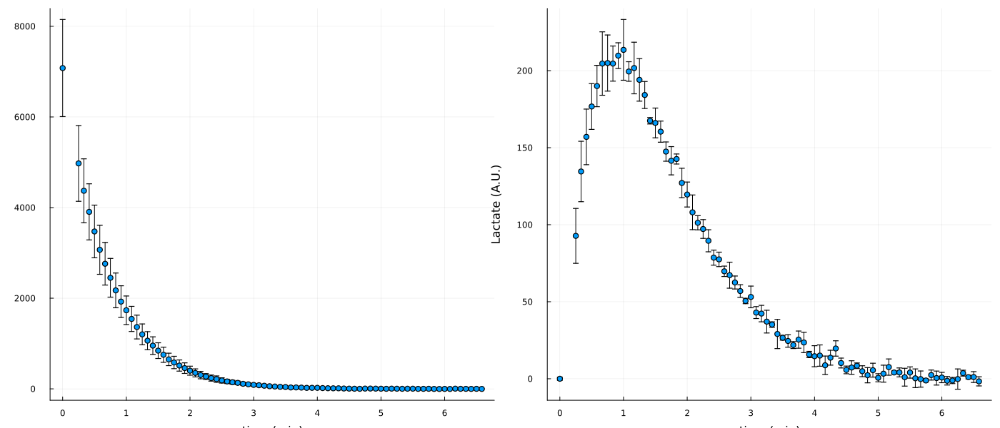

In [20]:
tim = vcat(Dat[1][1,1], Dat[1][4:end,1]);
pyrMEAN = mean([vcat(P0s[7], Dat[7][4:end,2]) vcat(P0s[8], Dat[8][4:end,2]) vcat(P0s[9], Dat[9][4:end,2])], dims = 2);
pyrSTD = std([vcat(P0s[7], Dat[7][4:end,2]) vcat(P0s[8], Dat[8][4:end,2]) vcat(P0s[9], Dat[9][4:end,2])], dims = 2);
lacMEAN = mean([vcat(0, Dat[7][4:end,3]) vcat(0, Dat[8][4:end,3]) vcat(0, Dat[9][4:end,3])], dims = 2);
lacSTD = std([vcat(0, Dat[7][4:end,3]) vcat(0, Dat[8][4:end,3]) vcat(0, Dat[9][4:end,3])], dims = 2);

for i in 1:length(pyrSTD)
    if pyrSTD[i] < 1
        pyrSTD[i] = 1;
    end
    if lacSTD[i] < 1
        lacSTD[i] = 1;
    end
end

CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_Dat.csv",
    DataFrame([tim pyrMEAN pyrSTD lacMEAN lacSTD], :auto), 
    header=["time", "Pyr_MEAN", "Pyr_STD", "Lac_MEAN", "Lac_STD"]);


plot(scatter(tim./60, pyrMEAN, yerror = pyrSTD, label = "", ylabel = "Pyruvate (A.U.)", xlabel = "time (min)"), 
    scatter(tim./60, lacMEAN, yerror = lacSTD, label = "", ylabel = "Lactate (A.U.)", xlabel = "time (min)"), size = (1400, 600))

#### 8 Million, No CO2

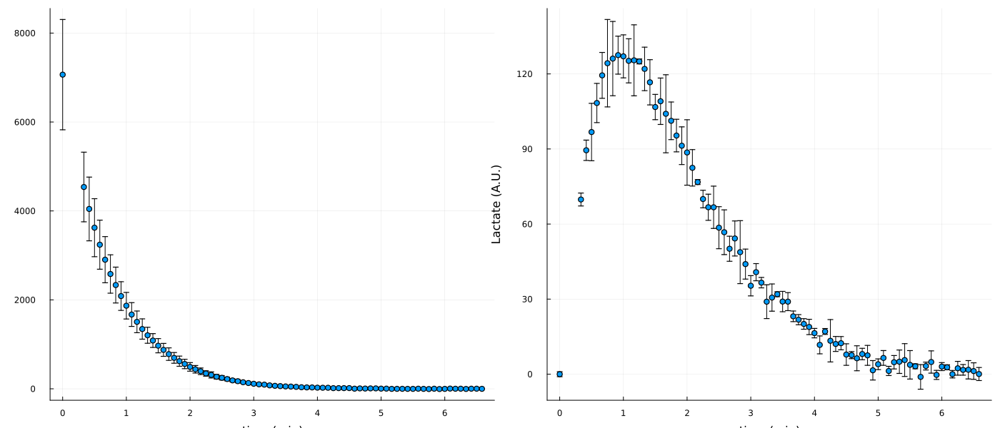

In [12]:
tim = vcat(Dat[1][1,1], Dat[1][5:end,1]);
pyrMEAN = mean([vcat(P0s[10], Dat[10][5:end,2]) vcat(P0s[11], Dat[11][5:end,2]) vcat(P0s[12], Dat[12][5:end,2])], dims = 2);
pyrSTD = std([vcat(P0s[10], Dat[10][5:end,2]) vcat(P0s[11], Dat[11][5:end,2]) vcat(P0s[12], Dat[12][5:end,2])], dims = 2);
lacMEAN = mean([vcat(0, Dat[10][5:end,3]) vcat(0, Dat[11][5:end,3]) vcat(0, Dat[12][5:end,3])], dims = 2);
lacSTD = std([vcat(0, Dat[10][5:end,3]) vcat(0, Dat[11][5:end,3]) vcat(0, Dat[12][5:end,3])], dims = 2);

# pyrMEAN = mean([vcat(P0s[10], Dat[10][4:end,2]) vcat(P0s[11], Dat[11][4:end,2]) ], dims = 2);
# pyrSTD = std([vcat(P0s[10], Dat[10][4:end,2]) vcat(P0s[11], Dat[11][4:end,2])], dims = 2);
# lacMEAN = mean([vcat(0, Dat[10][4:end,3]) vcat(0, Dat[11][4:end,3])], dims = 2);
# lacSTD = std([vcat(0, Dat[10][4:end,3]) vcat(0, Dat[11][4:end,3])], dims = 2);




for i in 1:length(pyrSTD)
    if pyrSTD[i] < 1
        pyrSTD[i] = 1;
    end
    if lacSTD[i] < 1
        lacSTD[i] = 1;
    end
end

CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_NoCO2_Dat.csv",
    DataFrame([tim pyrMEAN pyrSTD lacMEAN lacSTD], :auto), 
    header=["time", "Pyr_MEAN", "Pyr_STD", "Lac_MEAN", "Lac_STD"]);


plot(scatter(tim./60, pyrMEAN, yerror = pyrSTD, label = "", ylabel = "Pyruvate (A.U.)", xlabel = "time (min)"), 
    scatter(tim./60, lacMEAN, yerror = lacSTD, label = "", ylabel = "Lactate (A.U.)", xlabel = "time (min)"), size = (1400, 600))

In [12]:
P0s

15-element Vector{Float64}:
  6958.136589956337
  7458.120114620354
  8741.632824259454
  6696.892817182159
  7930.229145133655
  6716.359226048676
  5841.831099561959
  7670.508942892556
  7723.389923004057
  6271.245659842545
  6149.3221399365375
     0.0
  9190.2832695579
 10549.635798389325
 10026.790966970675

#### 4 Million Lysed

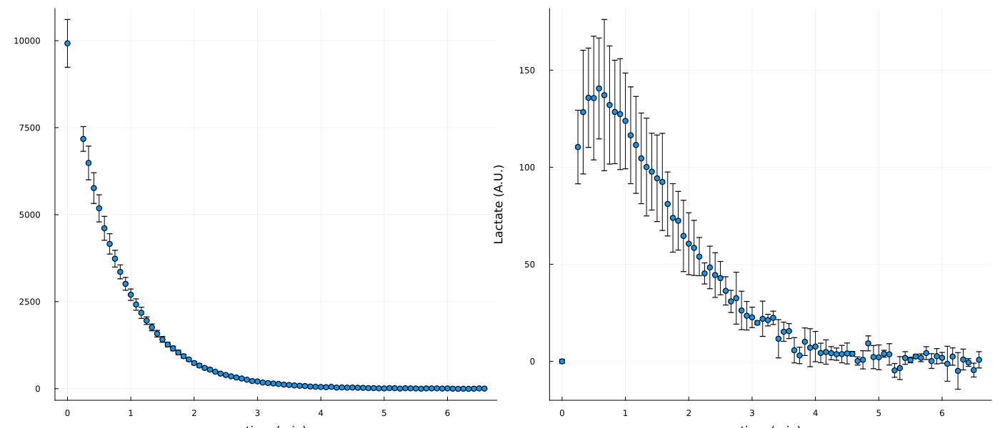

In [34]:
tim = vcat(Dat[1][1,1], Dat[1][4:end,1]);
pyrMEAN = mean([vcat(P0s[13], Dat[13][4:end,2]) vcat(P0s[14], Dat[14][4:end,2]) vcat(P0s[15], Dat[15][4:end,2])], dims = 2);
pyrSTD = std([vcat(P0s[13], Dat[13][4:end,2]) vcat(P0s[14], Dat[14][4:end,2]) vcat(P0s[15], Dat[15][4:end,2])], dims = 2);
lacMEAN = mean([vcat(0, Dat[13][4:end,3]) vcat(0, Dat[14][4:end,3]) vcat(0, Dat[15][4:end,3])], dims = 2);
lacSTD = std([vcat(0, Dat[13][4:end,3]) vcat(0, Dat[14][4:end,3]) vcat(0, Dat[15][4:end,3])], dims = 2);

for i in 1:length(pyrSTD)
    if pyrSTD[i] < 1
        pyrSTD[i] = 1;
    end
    if lacSTD[i] < 1
        lacSTD[i] = 1;
    end
end

CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Lysed_Dat.csv",
    DataFrame([tim pyrMEAN pyrSTD lacMEAN lacSTD], :auto), 
    header=["time", "Pyr_MEAN", "Pyr_STD", "Lac_MEAN", "Lac_STD"]);


plot(scatter(tim./60, pyrMEAN, yerror = pyrSTD, label = "", ylabel = "Pyruvate (A.U.)", xlabel = "time (min)"), 
    scatter(tim./60, lacMEAN, yerror = lacSTD, label = "", ylabel = "Lactate (A.U.)", xlabel = "time (min)"), size = (1400, 600))

#### Lysate Comparison

In [14]:
C4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
L4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Lysed_Dat.csv", DataFrame));

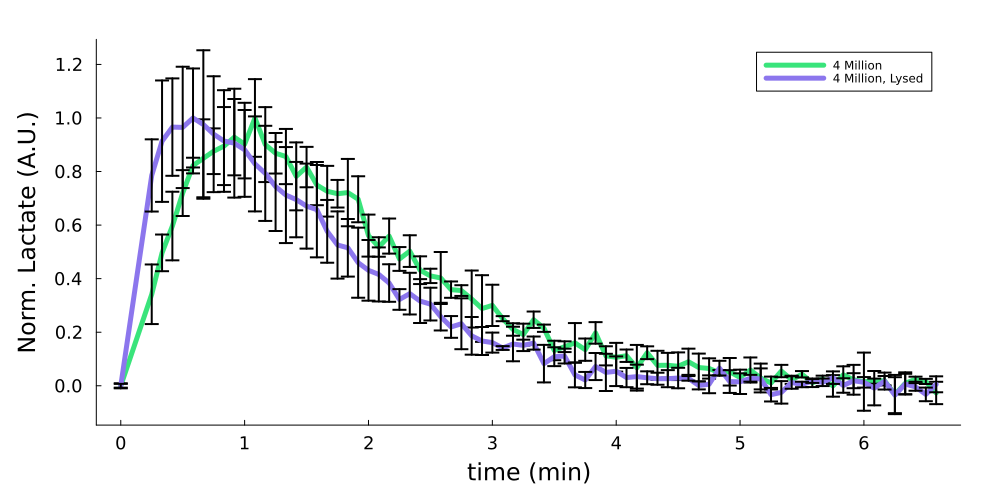

In [16]:
pp2 = plot(C4[:,1]./60, C4[:,4]./maximum(C4[:,4]),  label = "4 Million", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#39e47bff", markersize=7, linewidth=5)
plot!(C4[:,1]./60, C4[:,4]./maximum(C4[:,4]), yerror = C4[:,5]./maximum(C4[:,4]), label = "", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#39e47bff", markersize=7, linewidth=2)
plot!((L4[:,1]) ./60, L4[:,4]./maximum(L4[:,4]), label = "4 Million, Lysed", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#8c76edff", markersize=7, linewidth=5)
plot!((L4[:,1]) ./60, L4[:,4]./maximum(L4[:,4]), yerror = L4[:,5]./maximum(L4[:,4]), label = "", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#8c76edff", markersize=7, linewidth=2)


pp=plot(pp2, size = (1000,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\LysedVSTransport.svg")

display(pp)

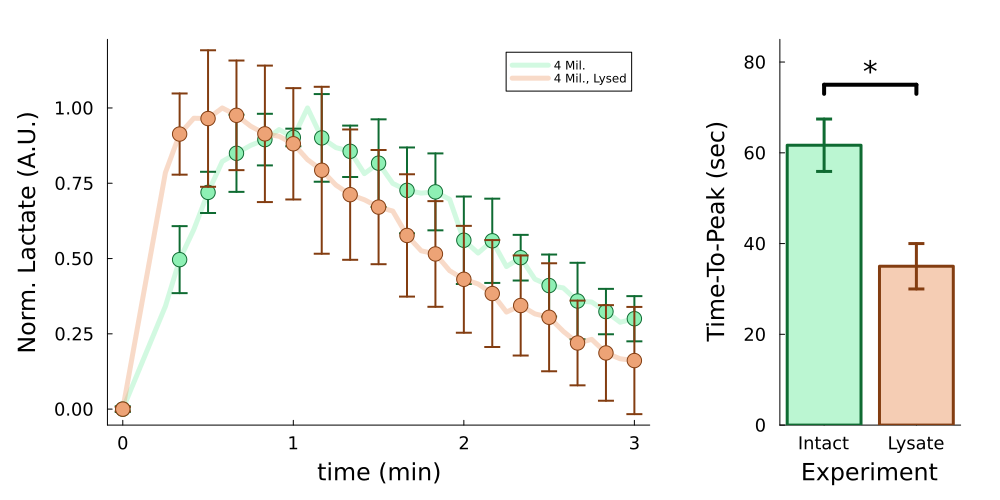

In [182]:
ma = 35
st = 2

pp2 = plot(C4[1:1:ma,1]./60, C4[1:1:ma,4]./maximum(C4[:,4]),  label = "4 Mil.", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#8ef0b4ff", markersize=7, linewidth=5, 
           alpha=0.4)
scatter!(C4[1:st:ma,1]./60, C4[1:st:ma,4]./maximum(C4[:,4]), yerror = C4[:,5]./maximum(C4[:,4]), label = "", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#8ef0b4ff", markersize=8, linewidth=2, linecolour = "#0f6b32ff", markerstrokecolour = "#0f6b32ff")

plot!((L4[1:1:ma,1]) ./60, L4[1:1:ma,4]./maximum(L4[:,4]), label = "4 Mil., Lysed", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#eda376ff", markersize=7, linewidth=5,
        alpha = 0.4)
scatter!((L4[1:st:ma,1]) ./60, L4[1:st:ma,4]./maximum(L4[:,4]), yerror = L4[:,5]./maximum(L4[:,4]), label = "", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#eda376ff", markersize=8, linewidth=2, linecolour = "#833d11ff", markerstrokecolour = "#833d11ff")


pp=plot(pp2, size = (800,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)




InT1 = Dat1_4M[:,1][findfirst(Dat1_4M[:,3] .== maximum(Dat1_4M[:,3]))]
InT2 = Dat1_4M[:,1][findfirst(Dat2_4M[:,3] .== maximum(Dat2_4M[:,3]))]
InT3 = Dat1_4M[:,1][findfirst(Dat3_4M[:,3] .== maximum(Dat3_4M[:,3]))]

LyT1 = Dat1_4M_Lysed[:,1][findfirst(Dat1_4M_Lysed[:,3] .== maximum(Dat1_4M_Lysed[:,3]))]
LyT2 = Dat1_4M_Lysed[:,1][findfirst(Dat2_4M_Lysed[:,3] .== maximum(Dat2_4M_Lysed[:,3]))]
LyT3 = Dat1_4M_Lysed[:,1][findfirst(Dat3_4M_Lysed[:,3] .== maximum(Dat3_4M_Lysed[:,3]))]

pvs = pvalue(OneSampleTTest(vec(convert.(Float64, [InT1,InT2,InT3])), vec(convert.(Float64, [LyT1,LyT2,LyT3]))))

if pvs > 0.05
    sg = "N.S."
elseif 0.05 >= pvs > 0.01
    sg = "*"
elseif 0.01 >= pvs > 0.001
    sg = "**"
end

bbb = bar(transpose([1,2]), transpose([mean([InT1,InT2,InT3]), mean([LyT1,LyT2,LyT3])]), yerror = transpose([std([InT1,InT2,InT3]), std([LyT1,LyT2,LyT3])]),
    label = "", grid = false, ylabel = "Time-To-Peak (sec)", xlabel = "Experiment", linewidth = 3, xticks = ([1,2], ["Intact", "Lysate"]), 
    colour = ["#bbf6d2ff" "#f5cdb4ff"], linecolour = ["#0f6b32ff" "#833d11ff"], markercolour = ["#0f6b32ff" "#833d11ff"], markersize=8)

plot!([1,2],[75,75], label = "", colour = "black", width = 4, ylim = (0,85))
plot!([1,1],[73,75], label = "", colour = "black", width = 4, ylim = (0,85))
plot!([2,2],[73,75], label = "", colour = "black", width = 4, ylim = (0,85))

annotate!(mean([1,2]), 78, sg, 20)

pp2=plot(bbb, size = (300,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)



PP1 = plot(pp, pp2, layout=grid(1,2, widths=(6/8,2/8)), size = (1000,500))



savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\LysedVSTransport_NEW.svg")

display(PP1)

In [168]:
mean([InT1,InT2,InT3]) - mean([LyT1,LyT2,LyT3])

26.666666666666664

In [18]:
println(trapz(C4[:,1]./60, C4[:,4]./maximum(C4[:,4])))
println(trapz((L4[:,1]) ./60, L4[:,4]./maximum(L4[:,4])))

2.1206655776581282
1.871810652981564


In [21]:
2.12/1.87

1.1336898395721926

In [20]:
2.12\1.87

0.8820754716981132

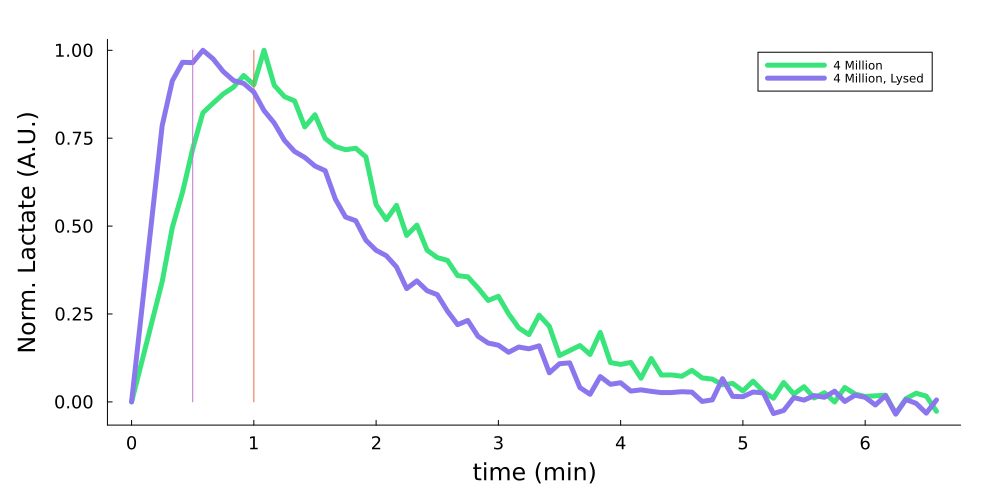

In [25]:
pp2 = plot(C4[:,1]./60, C4[:,4]./maximum(C4[:,4]),  label = "4 Million", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#39e47bff", markersize=7, linewidth=5)

plot!([1,1],[0, 1], label = "")

plot!((L4[:,1]) ./60, L4[:,4]./maximum(L4[:,4]), label = "4 Million, Lysed", xlabel="time (min)", ylabel = "Norm. Lactate (A.U.)", grid = false, color="#8c76edff", markersize=7, linewidth=5)

plot!([0.5,0.5],[0, 1], label = "")


pp=plot(pp2, size = (1000,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\LysedVSTransport.svg")

display(pp)

#### NoCO2 Comparison

In [169]:
C4b = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_Dat.csv", DataFrame));
L4b = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_NoCO2_Dat.csv", DataFrame));

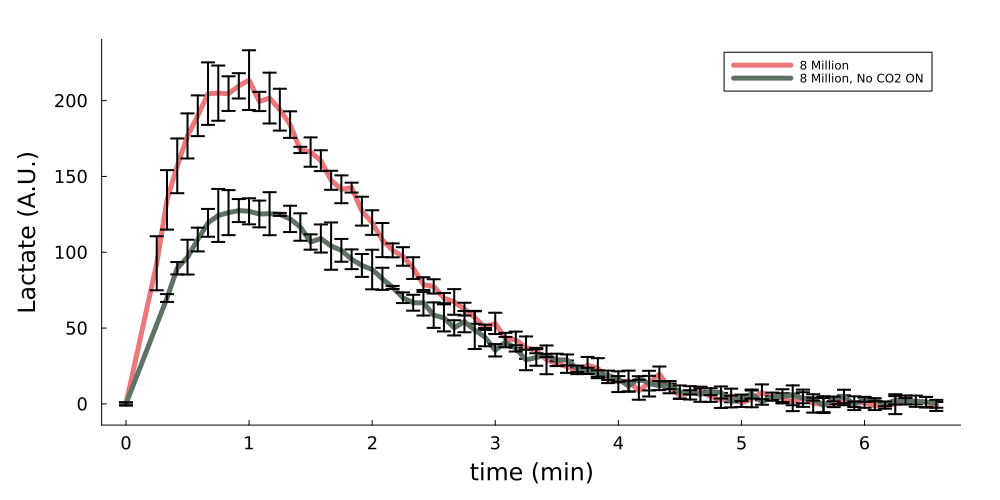

In [171]:
pp2 = plot(C4b[:,1]./60, C4b[:,4],  label = "8 Million", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=7, linewidth=5)
plot!(C4b[:,1]./60, C4b[:,4], yerror = C4b[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=7, linewidth=2)
plot!((L4b[:,1]) ./60, L4b[:,4], label = "8 Million, No CO2 ON", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#5F7364", markersize=7, linewidth=5)
plot!((L4b[:,1]) ./60, L4b[:,4], yerror = L4b[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#5F7364", markersize=7, linewidth=2)


pp=plot(pp2, size = (1000,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\HealthyVSNoCO2.svg")

display(pp)

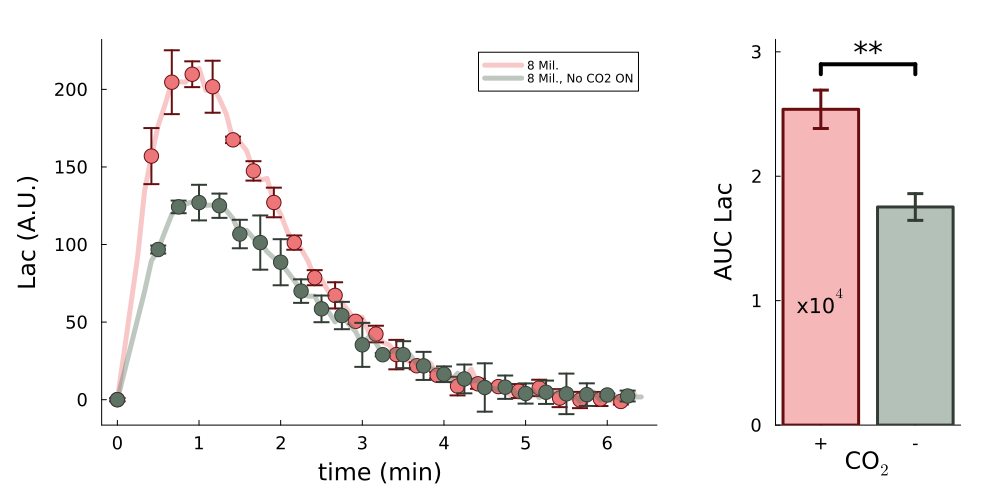

In [266]:
ma = 75
st = 3

pp2 = plot(C4b[1:1:ma,1]./60, C4b[1:1:ma,4],  label = "8 Mil.", xlabel="time (min)", ylabel = "Lac (A.U.)", grid = false, color="#ed7679ff", markersize=7, linewidth=5, alpha=0.4)
scatter!(C4b[1:st:ma,1]./60, C4b[1:st:ma,4], yerror = C4b[1:st:ma,5], label = "", xlabel="time (min)", ylabel = "Lac (A.U.)", grid = false, color="#ed7679ff", markersize=8, linewidth=2,
linecolour = "#680e10ff", markerstrokecolour = "#680e10ff")

plot!((L4b[1:1:ma,1]) ./60, L4b[1:1:ma,4], label = "8 Mil., No CO2 ON", xlabel="time (min)", ylabel = "Lac (A.U.)", grid = false, color="#5F7364", markersize=7, linewidth=5, alpha=0.4)
scatter!((L4b[1:st:ma,1]) ./60, L4b[1:st:ma,4], yerror = L4b[:,5], label = "", xlabel="time (min)", ylabel = "Lac (A.U.)", grid = false, color="#5F7364", markersize=8, linewidth=2,
linecolour = "#323c34ff", markerstrokecolour = "#323c34ff")


pp3=plot(pp2, size = (800,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\HealthyVSNoCO2.svg")

# display(pp3)





InA1 = trapz(Dat1_8M[4:end,1], Dat1_8M[4:end,3])
InA2 = trapz(Dat1_8M[4:end,1], Dat2_8M[4:end,3])
InA3 = trapz(Dat1_8M[4:end,1], Dat3_8M[4:end,3])

CnA1 = trapz(Dat1_8M_NoCO2[4:end,1], Dat1_8M_NoCO2[4:end,3])
CnA2 = trapz(Dat1_8M_NoCO2[4:end,1], Dat2_8M_NoCO2[4:end,3])
CnA3 = trapz(Dat1_8M_NoCO2[4:end,1], Dat3_8M_NoCO2[4:end,3])

pvs = pvalue(OneSampleTTest(vec(convert.(Float64, [InA1,InA2,InA3])), vec(convert.(Float64, [CnA1,CnA2,CnA3]))))

if pvs > 0.05
    sg = "N.S."
elseif 0.05 >= pvs > 0.01
    sg = "*"
elseif 0.01 >= pvs > 0.001
    sg = "**"
end

bbb2 = bar(transpose([1,2]), transpose([mean([InA1,InA2,InA3]), mean([CnA1,CnA2,CnA3])])./10^4, yerror = transpose([std([InA1,InA2,InA3]), std([CnA1,CnA2,CnA3])])./10^4,
    label = "", grid = false, ylabel = "AUC Lac", xlabel = "CO"*L"_2", linewidth = 3, xticks = ([1,2], ["+", "-"]), 
    colour = ["#f6b7b9ff" "#b4c1b8ff"], linecolour = ["#680e10ff" "#323c34ff"], markercolour = ["#680e10ff" "#323c34ff"], markersize=8)

plot!([1,2],[2.9e4,2.9e4]./10^4, label = "", colour = "black", width = 4, ylim = (0,3.1e4./10^4))
plot!([1,1],[2.82e4,2.9e4]./10^4, label = "", colour = "black", width = 4)
plot!([2,2],[2.9e4,2.82e4]./10^4, label = "", colour = "black", width = 4)

annotate!(mean([1,2]), 3e4./10^4, sg, 20)

annotate!(1,1, "x10"*L"^4")

pp4=plot(bbb2, size = (300,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)


PP2 = plot(pp3, pp4, layout=grid(1,2, widths=(6/8,2/8)), size = (1000,500))



savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\HealthyVSNoCO2_NEW.svg")

display(PP2)

In [269]:
mean([InA1,InA2,InA3])\ mean([CnA1,CnA2,CnA3])

0.6906854861870672